In [ ]:
import tensorflow as tf

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers

import os
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# Get project files
!wget https://cdn.freecodecamp.org/project-data/cats-and-dogs/cats_and_dogs.zip

!unzip cats_and_dogs.zip

PATH = 'cats_and_dogs'

train_dir = os.path.join(PATH, 'train')
validation_dir = os.path.join(PATH, 'validation')
test_dir = os.path.join(PATH, 'test')

# Get number of files in each directory. The train and validation directories
# each have the subdirecories "dogs" and "cats".
total_train = sum([len(files) for r, d, files in os.walk(train_dir)])
total_val = sum([len(files) for r, d, files in os.walk(validation_dir)])
total_test = len(os.listdir(test_dir))

# Variables for pre-processing and training.
batch_size = 128
epochs = 15
IMG_HEIGHT = 150
IMG_WIDTH = 150

Streaming output truncated to the last 5000 lines.
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.60.jpg  
  inflating: cats_and_dogs/train/dogs/dog.858.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.858.jpg  
  inflating: cats_and_dogs/train/dogs/dog.680.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.680.jpg  
  inflating: cats_and_dogs/train/dogs/dog.694.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.694.jpg  
  inflating: cats_and_dogs/train/dogs/dog.864.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.864.jpg  
  inflating: cats_and_dogs/train/dogs/dog.870.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.870.jpg  
  inflating: cats_and_dogs/train/dogs/dog.871.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.871.jpg  
  inflating: cats_and_dogs/train/dogs/dog.865.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.865.jpg  
  inflating: cats_and_dogs/train/dogs/dog.695.jpg  
  inflating: __MACOSX/cats_and

In [ ]:
print(total_test)
print(os.listdir(test_dir))

51
['20.jpg', '22.jpg', '24.jpg', '37.jpg', '1.jpg', '42.jpg', '8.jpg', '43.jpg', '13.jpg', '41.jpg', '31.jpg', '38.jpg', '49.jpg', '36.jpg', '7.jpg', '50.jpg', '16.jpg', '25.jpg', '.DS_Store', '40.jpg', '47.jpg', '34.jpg', '10.jpg', '17.jpg', '9.jpg', '29.jpg', '46.jpg', '12.jpg', '4.jpg', '23.jpg', '45.jpg', '19.jpg', '44.jpg', '5.jpg', '28.jpg', '15.jpg', '2.jpg', '33.jpg', '30.jpg', '6.jpg', '39.jpg', '18.jpg', '35.jpg', '27.jpg', '32.jpg', '26.jpg', '14.jpg', '11.jpg', '48.jpg', '3.jpg', '21.jpg']


In [ ]:
subfolders = [f.path for f in os.scandir(test_dir) if f.is_dir()]

if subfolders:
    print("Subfolders found in test_dir:")
    for folder in subfolders:
        print(folder)
else:
    print("No subfolders found in test_dir. The directory contains only files.")

No subfolders found in test_dir. The directory contains only files.


In [ ]:
import shutil

# Define the new subdirectory name
subdirectory_name = 'sub_test_dir'
subdirectory_path = os.path.join(test_dir, subdirectory_name)

# Create the subdirectory if it doesn't already exist
os.makedirs(subdirectory_path, exist_ok=True)

# Move each file in test_dir to the new subdirectory
for filename in os.listdir(test_dir):
    file_path = os.path.join(test_dir, filename)

    # Check if it is a file (not a directory) before moving
    if os.path.isfile(file_path):
        shutil.move(file_path, os.path.join(subdirectory_path, filename))

print(f"All files moved to {subdirectory_path}")


All files moved to cats_and_dogs/test/sub_test_dir


In [ ]:
# 3
train_image_generator = ImageDataGenerator(rescale=1.0/255)
validation_image_generator = ImageDataGenerator(rescale=1.0/255)
test_image_generator = ImageDataGenerator(rescale=1.0/255)

train_data_gen = train_image_generator.flow_from_directory(batch_size=batch_size, directory=train_dir, target_size=(IMG_HEIGHT, IMG_WIDTH),class_mode='binary')
val_data_gen = validation_image_generator.flow_from_directory(batch_size=batch_size, directory=validation_dir, target_size=(IMG_HEIGHT, IMG_WIDTH),class_mode='binary')
test_data_gen = test_image_generator.flow_from_directory(batch_size=batch_size, directory=test_dir, target_size=(IMG_HEIGHT, IMG_WIDTH),class_mode= 'input',color_mode="rgb", shuffle=False)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Found 50 images belonging to 1 classes.


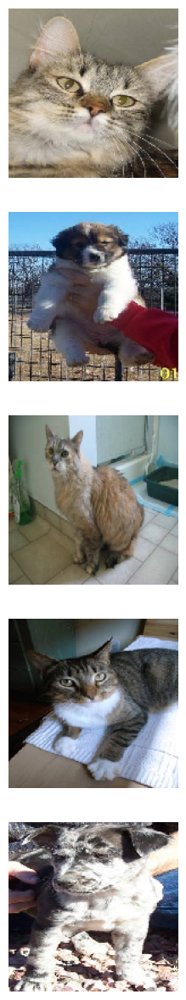

In [ ]:
# 4
def plotImages(images_arr, probabilities = False):
    fig, axes = plt.subplots(len(images_arr), 1, figsize=(5,len(images_arr) * 3))
    if probabilities is False:
      for img, ax in zip( images_arr, axes):
          ax.imshow(img)
          ax.axis('off')
    else:
      for img, probability, ax in zip( images_arr, probabilities, axes):
          ax.imshow(img)
          ax.axis('off')
          if probability > 0.5:
              ax.set_title("%.2f" % (probability*100) + "% dog")
          else:
              ax.set_title("%.2f" % ((1-probability)*100) + "% cat")
    plt.show()

sample_training_images, _ = next(train_data_gen)
plotImages(sample_training_images[:5])


In [ ]:
# 5
train_image_generator =ImageDataGenerator(rescale=1.0/255, rotation_range=40, width_shift_range=0.2, height_shift_range=0.2, shear_range=0.2,zoom_range=0.2 , horizontal_flip=True)


Found 2000 images belonging to 2 classes.


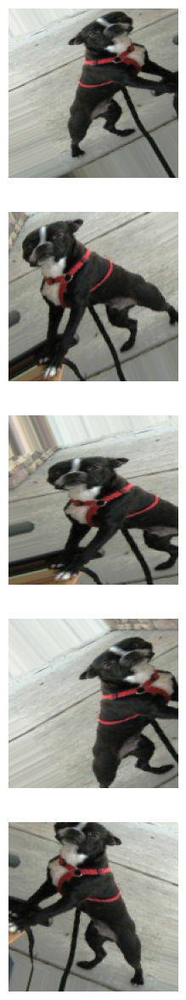

In [ ]:
# 6
train_data_gen = train_image_generator.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

augmented_images = [train_data_gen[0][0][0] for i in range(5)]

plotImages(augmented_images)

In [ ]:
#7

model = Sequential()
model.add(Conv2D(32, (3,3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
model.add(MaxPooling2D(2,2))
model.add(BatchNormalization())
model.add(Dropout(0.25))
model.add(Conv2D(64, (3,3), activation='relu'))
model.add(MaxPooling2D(2,2))
model.add(BatchNormalization())
model.add(Dropout(0.25))
model.add(Conv2D(128, (3,3), activation='relu'))
model.add(MaxPooling2D(2,2))
model.add(BatchNormalization())
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='softmax'))


model.compile(optimizer= 'adam' , loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_18 (Conv2D)                   │ (None, 148, 148, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_18 (MaxPooling2D)      │ (None, 74, 74, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_18               │ (None, 74, 74, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_24 (Dropout)                 │ (None, 74, 74, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_19 (Conv2D)                   │ (None, 72, 72, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_19 (MaxPooling2D)      │ (None, 36, 36, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_19               │ (None, 36, 36, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_25 (Dropout)                 │ (None, 36, 36, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_20 (Conv2D)                   │ (None, 34, 34, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_20 (MaxPooling2D)      │ (None, 17, 17, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_20               │ (None, 17, 17, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_26 (Dropout)                 │ (None, 17, 17, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_6 (Flatten)                  │ (None, 36992)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 128)                 │       4,735,104 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_27 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,829,377 (18.42 MB)

 Trainable params: 4,828,929 (18.42 MB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
class_weight= {0: 1.0, 1: 1.5}

In [ ]:
#8
history = model.fit(x=train_data_gen, steps_per_epoch= 15 , epochs=epochs, validation_data=(val_data_gen), validation_steps=5 , class_weight= class_weight)

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/losses/losses.py:27: SyntaxWarning: In loss categorical_crossentropy, expected y_pred.shape to be (batch_size, num_classes) with num_classes > 1. Received: y_pred.shape=(None, 1). Consider using 'binary_crossentropy' if you only have 2 classes.
  return self.fn(y_true, y_pred, **self._fn_kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored

15/15 ━━━━━━━━━━━━━━━━━━━━ 142s 9s/step - accuracy: 0.4897 - loss: 0.0000e+00 - val_accuracy: 0.4906 - val_loss: 0.0000e+00
Epoch 2/15
 1/15 ━━━━━━━━━━━━━━━━━━━━ 1:54 8s/step - accuracy: 0.4297 - loss: 0.0000e+00

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


15/15 ━━━━━━━━━━━━━━━━━━━━ 13s 365ms/step - accuracy: 0.4297 - loss: 0.0000e+00 - val_accuracy: 0.4611 - val_loss: 0.0000e+00
Epoch 3/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 138s 9s/step - accuracy: 0.5042 - loss: 0.0000e+00 - val_accuracy: 0.4875 - val_loss: 0.0000e+00
Epoch 4/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 14s 492ms/step - accuracy: 0.5234 - loss: 0.0000e+00 - val_accuracy: 0.4944 - val_loss: 0.0000e+00
Epoch 5/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 189s 9s/step - accuracy: 0.4998 - loss: 0.0000e+00 - val_accuracy: 0.4797 - val_loss: 0.0000e+00
Epoch 6/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 14s 486ms/step - accuracy: 0.4922 - loss: 0.0000e+00 - val_accuracy: 0.4778 - val_loss: 0.0000e+00
Epoch 7/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 186s 9s/step - accuracy: 0.4909 - loss: 0.0000e+00 - val_accuracy: 0.4859 - val_loss: 0.0000e+00
Epoch 8/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - accuracy: 0.5078 - loss: 0.0000e+00 - val_accuracy: 0.4722 - val_loss: 0.0000e+00
Epoch 9/15
15/15 ━━━━━━━━━━━━━━━━━━━━ 172s 9s/step - accuracy

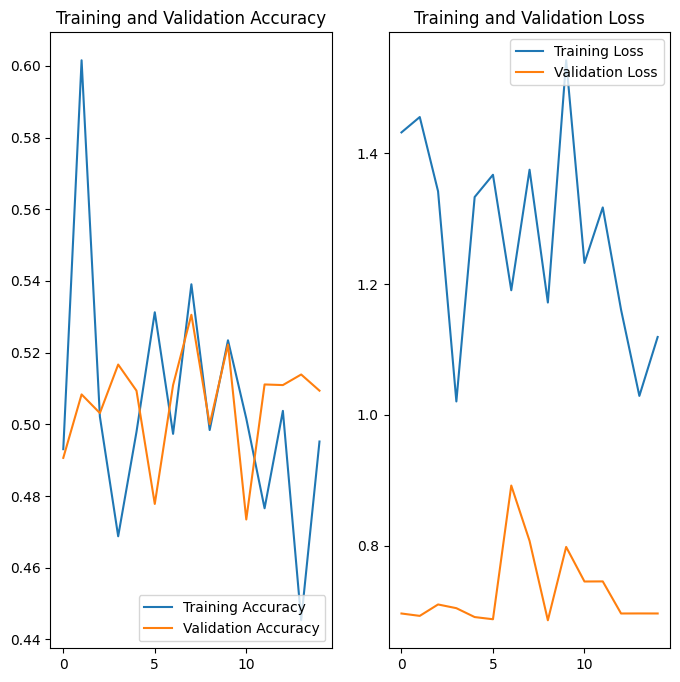

In [ ]:
# 9
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (50, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
[0.99999994]


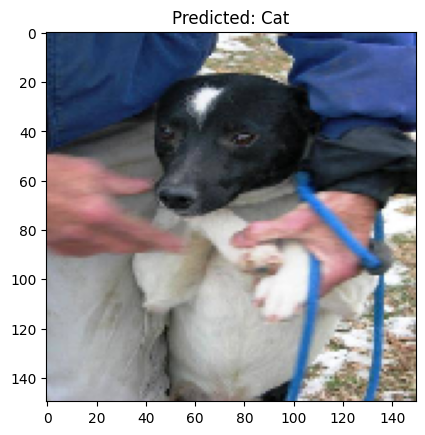

[0.99999994]


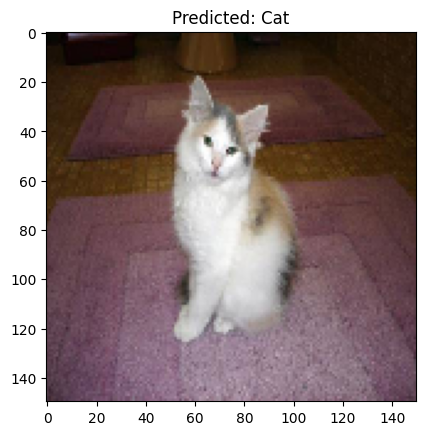

[0.99999994]


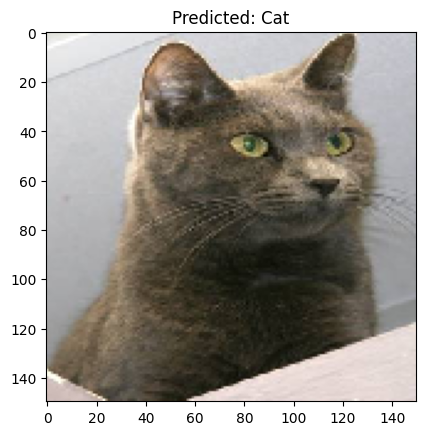

[0.99999994]


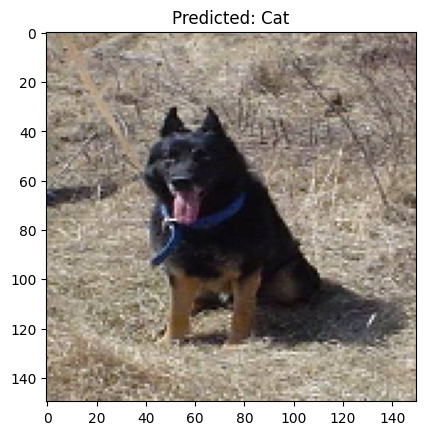

[0.99999994]


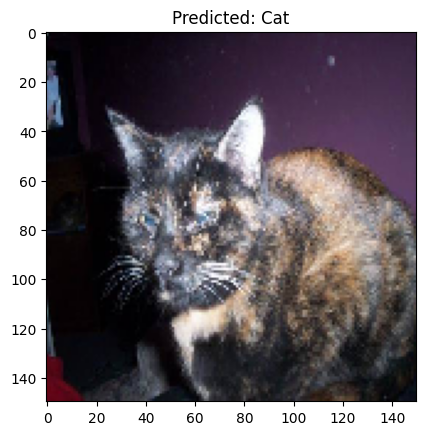

[0.99999994]


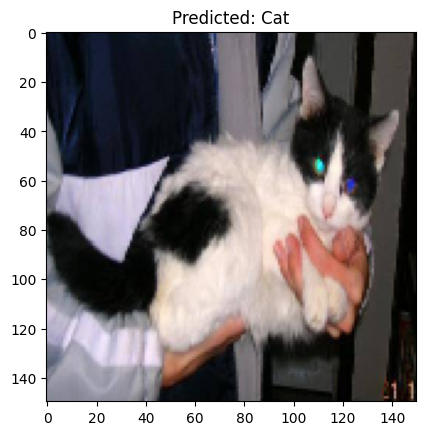

[0.99999994]


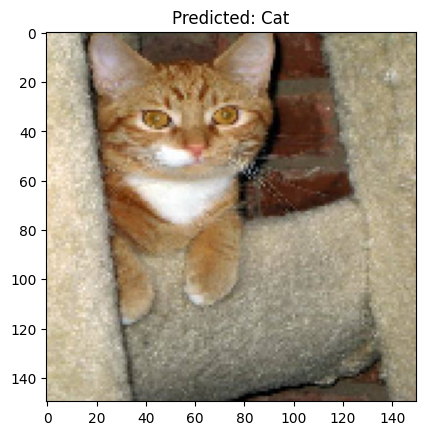

[0.99999994]


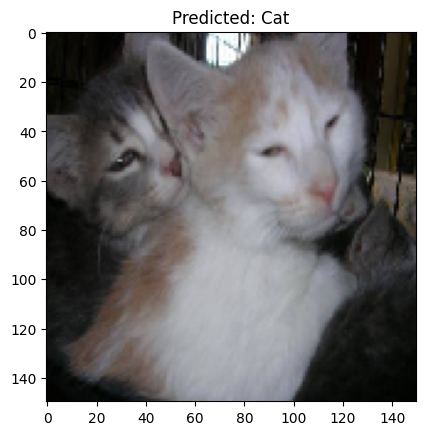

[0.99999994]


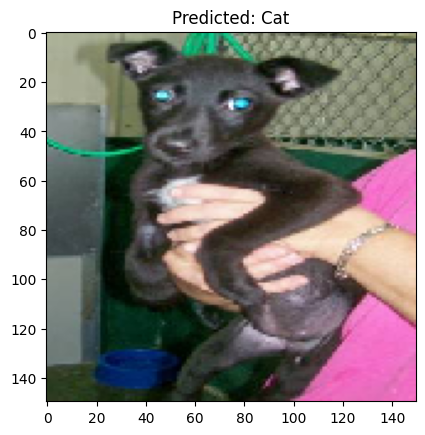

[0.99999994]


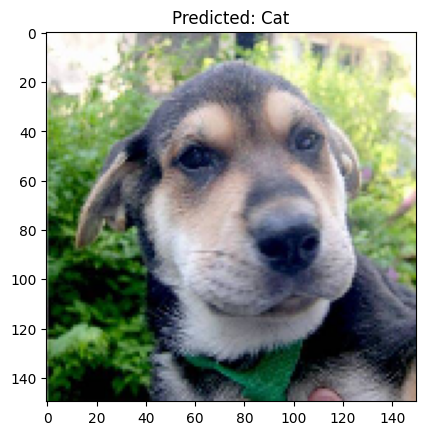

[0.99999994]


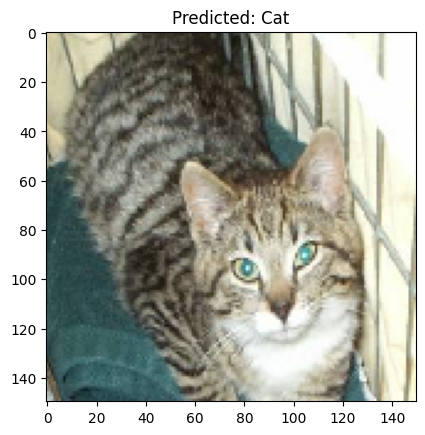

[0.99999994]


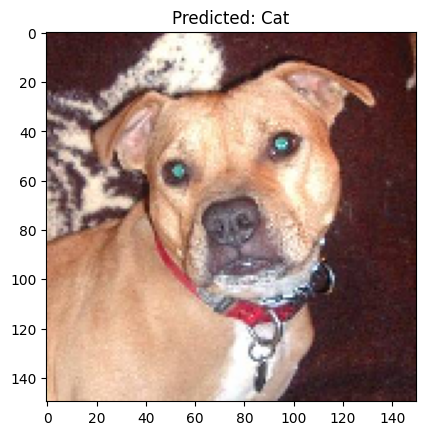

[0.99999994]


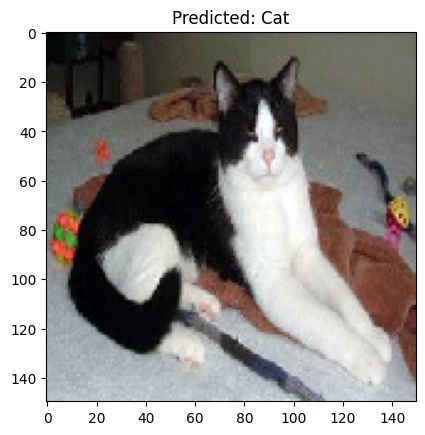

[0.99999994]


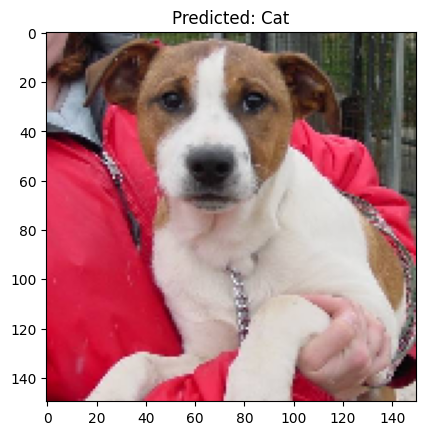

[0.99999994]


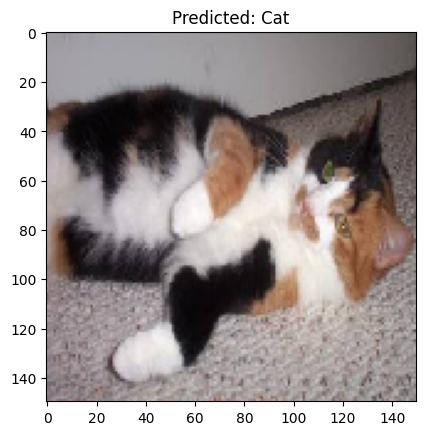

[0.99999994]


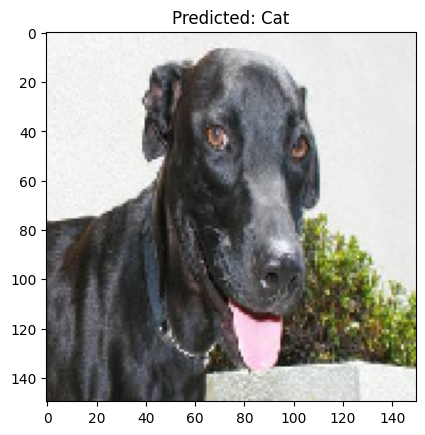

[0.99999994]


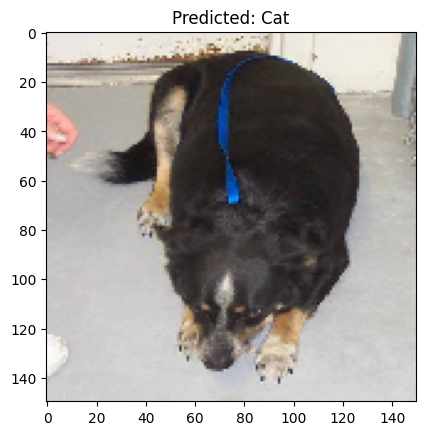

[0.99999994]


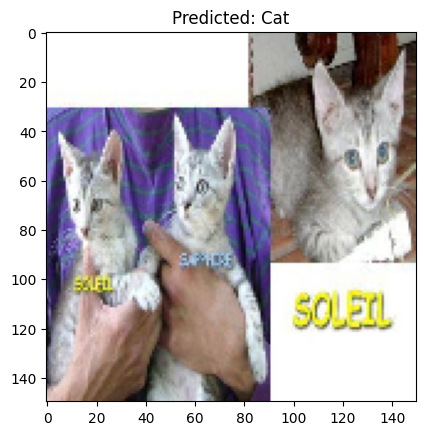

[0.99999994]


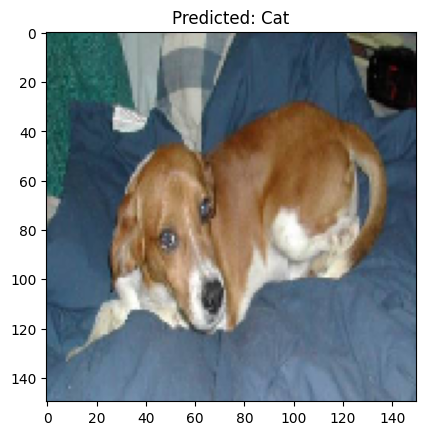

[0.99999994]


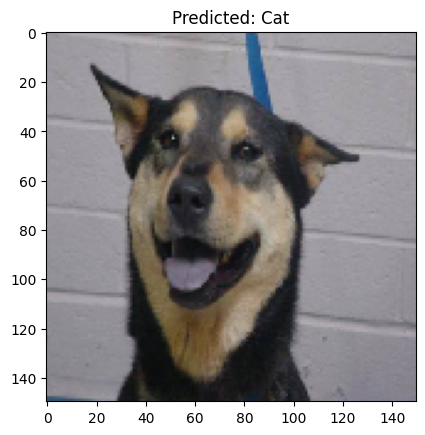

[0.99999994]


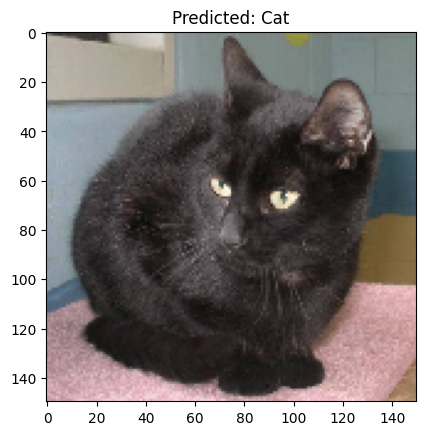

[0.99999994]


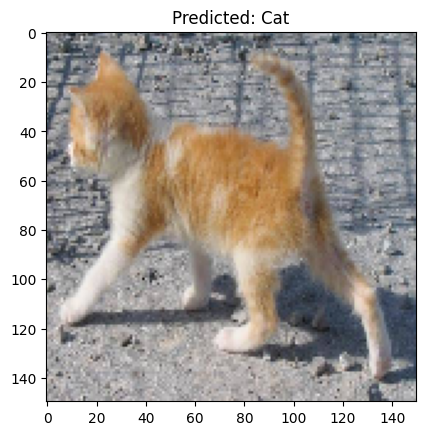

[0.99999994]


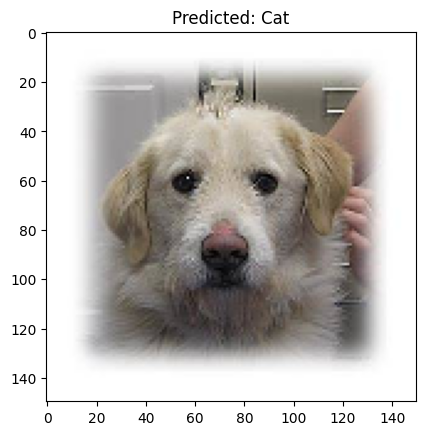

[0.99999994]


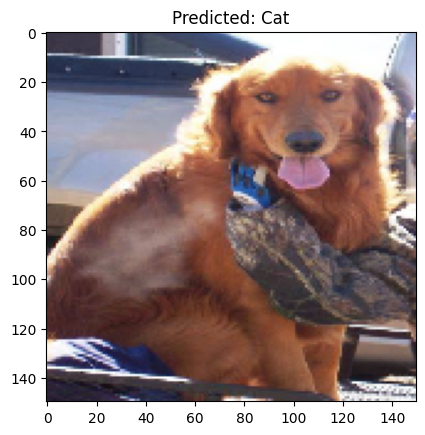

[0.99999994]


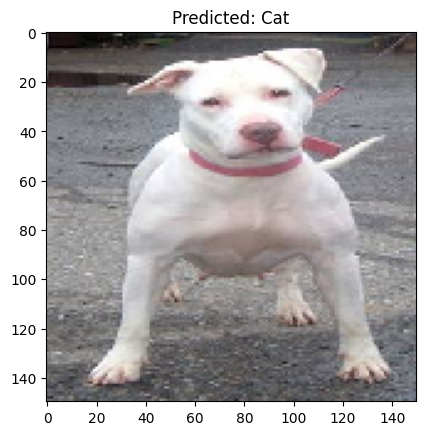

[0.99999994]


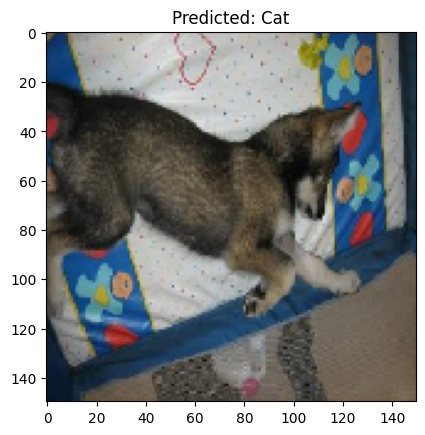

[0.99999994]


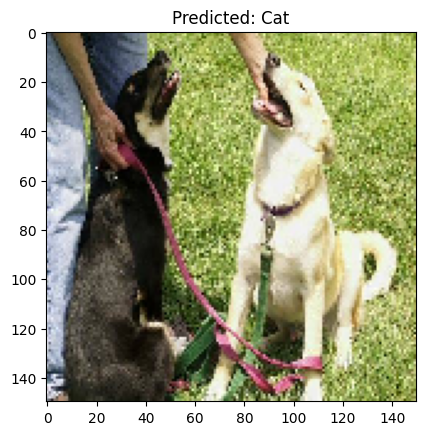

[0.99999994]


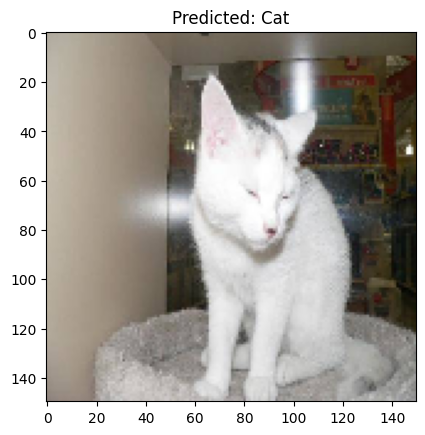

[0.99999994]


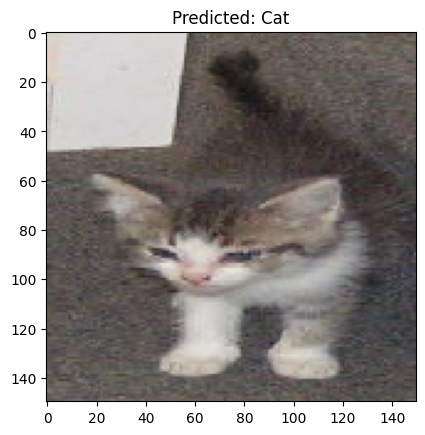

[0.99999994]


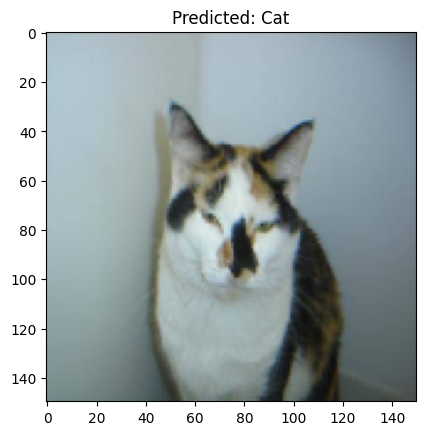

[0.99999994]


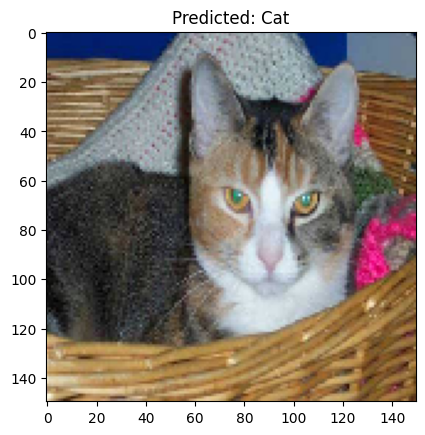

[0.99999994]


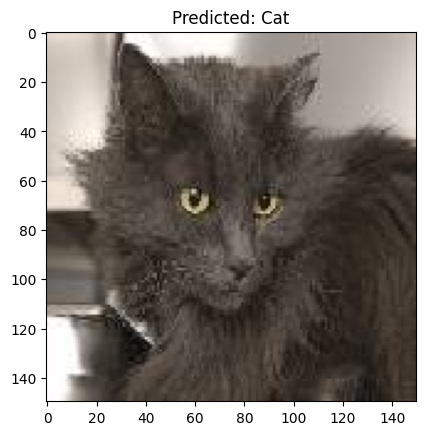

[0.99999994]


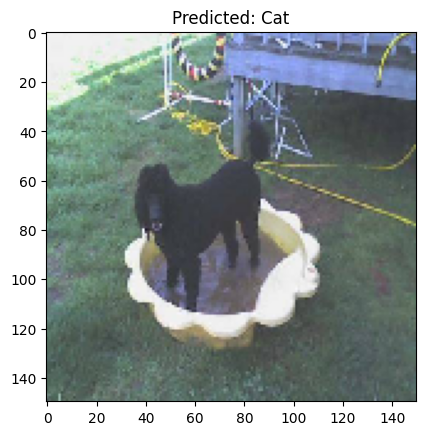

[0.99999994]


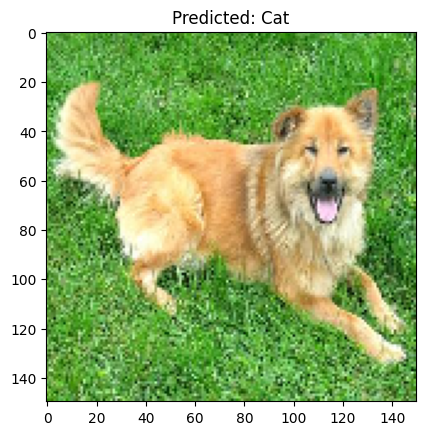

[0.99999994]


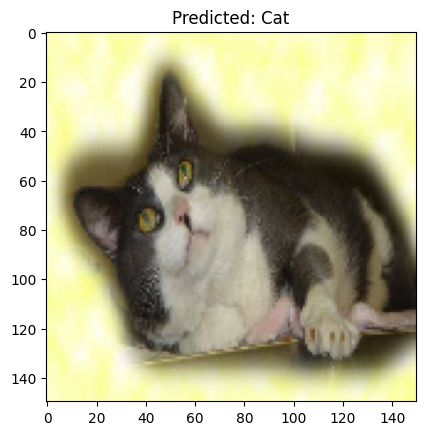

[0.99999994]


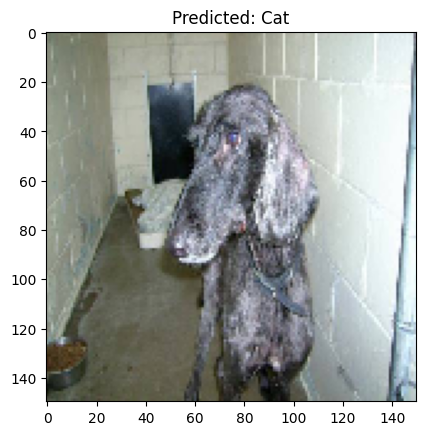

[0.99999994]


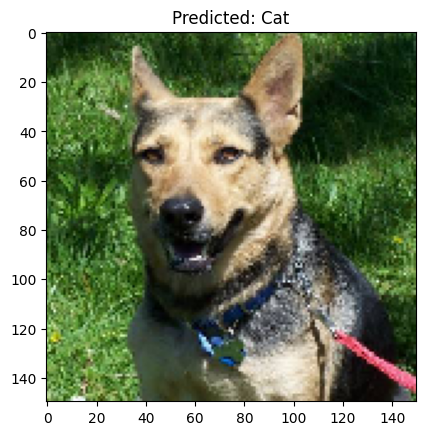

[0.99999994]


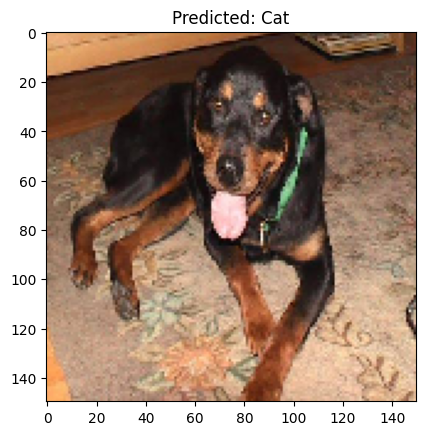

[0.99999994]


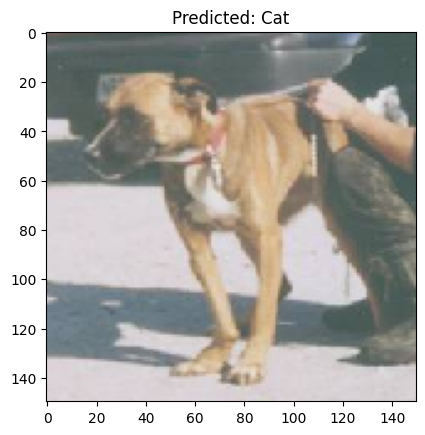

[0.99999994]


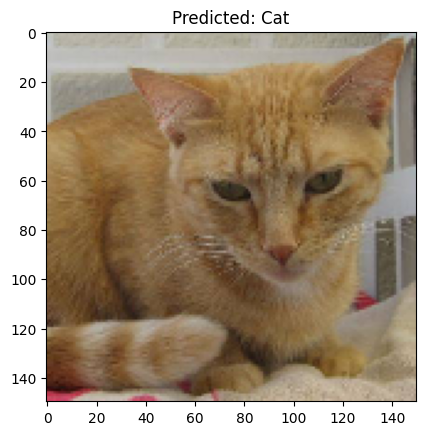

[0.99999994]


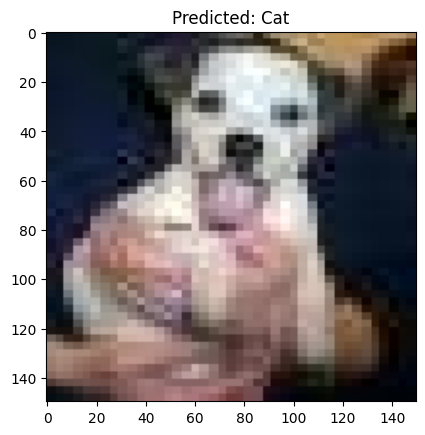

[0.99999994]


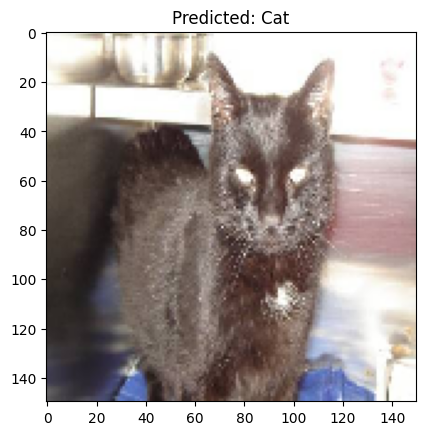

[0.99999994]


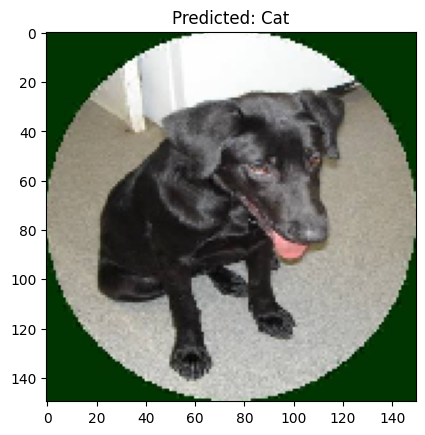

[0.99999994]


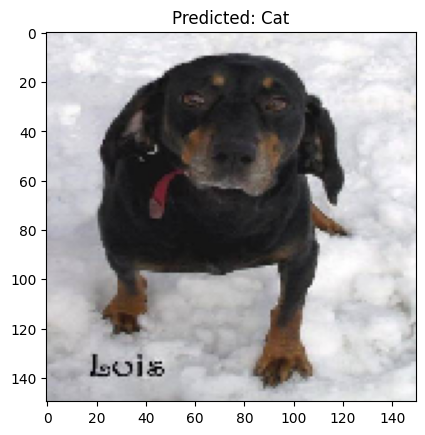

[0.99999994]


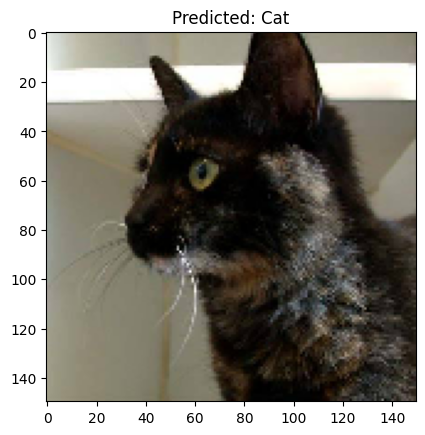

[0.99999994]


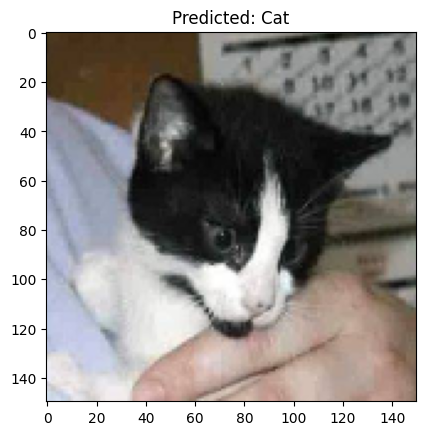

[0.99999994]


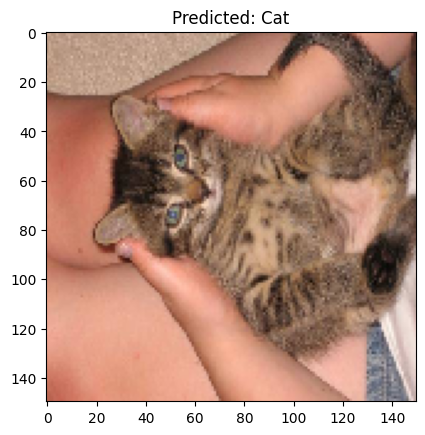

[0.99999994]


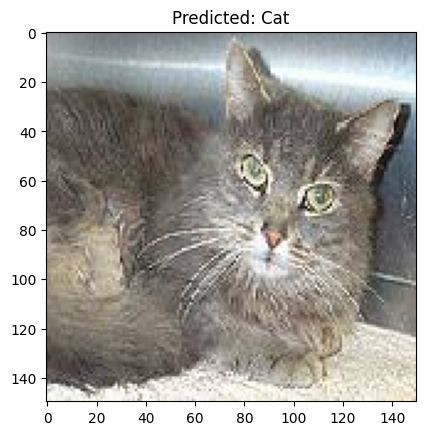

[1.]


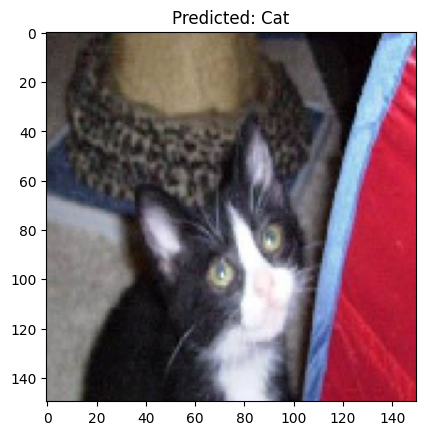

[1.]


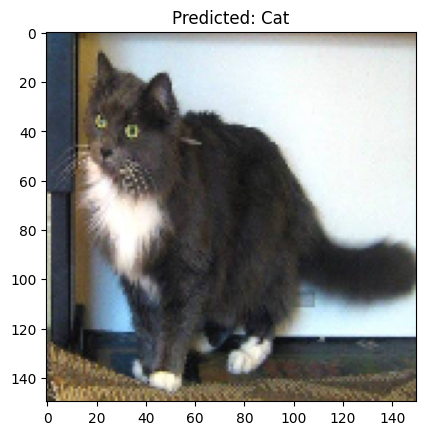

In [ ]:
#10
probabilities = model.predict(test_data_gen)
for images, labels in test_data_gen:  # Get a batch of images and labels
    for i in range(len(images)):  # Iterate through the images in the batch
        predicted_class= np.argmax(probabilities[i])
        class_label = 'Cat' if predicted_class == 0 else 'Dog'
        print(probabilities[i])  # Assuming probabilities are calculated for the entire dataset
        plt.figure()
        plt.imshow(images[i])  # Display the current image
        plt.title(f'Predicted: {class_label}')
        plt.grid(False)
        plt.show()
    break  # Stop after processing one batch to avoid potentially plotting all data

In [ ]:
# 11
answers =  [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0,
            1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0,
            1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1,
            1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1,
            0, 0, 0, 0, 0, 0]

correct = 0
'''
for probability, answer in zip(probabilities, answers):
  if round(probability) == answer:
    correct +=1
'''

for probability, answer in zip(probabilities, answers):
  # Get the predicted class by finding the index of the maximum probability
  predicted_class = probability.argmax()
  # Compare the predicted class with the actual answer
  if predicted_class == answer:
    correct += 1

percentage_identified = (correct / len(answers)) * 100

passed_challenge = percentage_identified >= 63

print(f"Your model correctly identified {round(percentage_identified, 2)}% of the images of cats and dogs.")

if passed_challenge:
  print("You passed the challenge!")
else:
  print("You haven't passed yet. Your model should identify at least 63% of the images. Keep trying. You will get it!")

Your model correctly identified 44.0% of the images of cats and dogs.
You haven't passed yet. Your model should identify at least 63% of the images. Keep trying. You will get it!
